<table style="background-color:#FFFFFF">   
  <tr>     
  <td><img src="https://upload.wikimedia.org/wikipedia/commons/9/95/Logo_EPFL_2019.svg" width="150x"/>
  </td>     
  <td>
  <h1> <b>CS-461: Foundation Models and Generative AI</b> </h1>
  Prof. Charlotte Bunne  
  </td>   
  </tr>
</table>

# 📚  Exercise Session (Coding Part) - 4

Overview of the coding part:

* [**TASK 1:** DDPM Implementation](#task_name_1)
     
* [**TASK 2:** Introduction to the `diffusers` Library](#task_name_2)
    - [Subtask A: Running Stable Diffusion](#subtask_name_2_A)
    - [Subtask B: Classifier-Free Guidance Experiments](#subtask_name_2_B)


Install the following packages (already installed in Colab):

In [ ]:
%%writefile requirements.txt
torch
matplotlib
scikit-learn
diffusers
transformers
scipy
ftfy
accelerate

Writing requirements.txt


In [ ]:
!pip install -r requirements.txt

Import some libs:

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina' # make plots prettier

<a name="task_name_1"></a>
## Task 1: Implementing DDPM

In this task, we will go through [Denoising Diffusion Probabilistic Models (DDPM)](https://arxiv.org/abs/2006.11239) implementation. Let's start by loading a toy dataset with 2 classes.

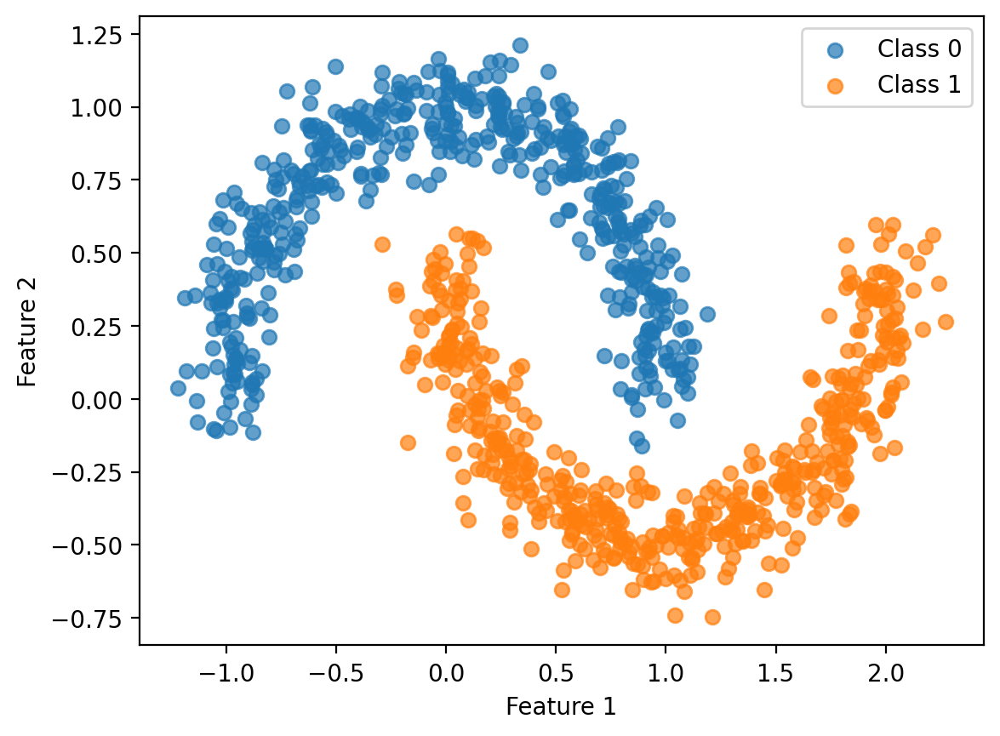

In [ ]:
from sklearn.datasets import make_moons

X, y = make_moons(n_samples=1000, noise=0.1, random_state=42)

plt.scatter(X[y==0, 0], X[y==0, 1], label="Class 0", alpha=0.7)
plt.scatter(X[y==1, 0], X[y==1, 1], label="Class 1", alpha=0.7)

plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.legend()

plt.show()

We want to create a Diffusion class that will iteratively add noise to these moons (forward process) and then denoise them (backward process). To train such a model, we will need training examples. Let's create a simple `pytorch` dataset. We will normalize values to have zero mean and 1 std for stability.

In [ ]:
from torch.utils.data import Dataset, DataLoader
import torch

class MoonDataset(Dataset):

    def __init__(self, n=200):
        X, y = make_moons(n_samples=n, noise=0.1, random_state=42)
        self.X = torch.tensor(X).to(torch.float32)
        self.y = torch.tensor(y)
        self.n = n

        self.mean = self.X.mean(0)
        self.std = self.X.std(0)


    def __len__(self):
        return self.n

    def __getitem__(self, index):
        X = self.X[index]
        # normalize
        X = (X - self.mean) / self.std
        y = self.y[index]
        return X, y

In [ ]:
dataset = MoonDataset(n=10000)
loader = DataLoader(dataset, batch_size=32, shuffle=True)

Now let's implement the Diffusion in the DDPM-style. We need to define the $p$ and $q$ distributions. Below you will find the skelet for the Diffusion class. Fill in the gaps using the equations from the paper (see doc-strings).


*Hint*: For stability purposes, we suggest to use $\log \text{Var}$ instead of Var (better for small $\sigma$ (better numerical range and more stable gradients); also, guarantees positivity):

$$
\sigma^2 = \exp (\log \text{Var})
$$

**Note**: Ignore class labels for now.

In [ ]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as F


class GaussianDiffusion(nn.Module):
    """
    DDPM Implementation
    """
    def __init__(self, model, image_shape, timesteps=1000, beta_schedule="linear", device=None):
        super().__init__()
        self.model = model
        self.image_shape = image_shape  # e.g. (C,H,W)
        self.T = timesteps
        self.device = device or next(model.parameters()).device

        if beta_schedule == "linear":
            betas = torch.linspace(1e-4, 2e-2, self.T) # See Section 4
        else:
            raise ValueError("Unknown beta_schedule")

        # register buffers
        # we pre-compute common calculations, such as alpha, \overline{alpha}, etc.
        self.register_buffer("betas", betas)
        alphas = 1.0 - betas
        alphas_cumprod = torch.cumprod(alphas, dim=0)
        alphas_cumprod_prev = torch.cat(
            [torch.ones(1, dtype=alphas_cumprod.dtype, device=alphas_cumprod.device),
            alphas_cumprod[:-1]],
            dim=0
        )

        self.register_buffer("alphas", alphas)
        self.register_buffer("alphas_cumprod", alphas_cumprod)
        self.register_buffer("alphas_cumprod_prev", alphas_cumprod_prev)

        self.register_buffer("sqrt_alphas_cumprod", torch.sqrt(alphas_cumprod))
        self.register_buffer("sqrt_one_minus_alphas_cumprod", torch.sqrt(1.0 - alphas_cumprod))
        self.register_buffer("sqrt_recip_alphas", torch.sqrt(1.0 / alphas))

        # posterior q(x_{t-1} | x_t, x_0)
        posterior_variance = betas * (1.0 - alphas_cumprod_prev) / (1.0 - alphas_cumprod)
        # clip variance with a very small value (1e-20) before taking log for safety
        posterior_log_variance_clipped = torch.log(posterior_variance.clamp(min=1e-20))
        posterior_mean_coef1 = betas * torch.sqrt(alphas_cumprod_prev) / (1.0 - alphas_cumprod)
        posterior_mean_coef2 = (1.0 - alphas_cumprod_prev) * torch.sqrt(alphas) / (1.0 - alphas_cumprod)

        self.register_buffer("posterior_variance", posterior_variance)
        self.register_buffer("posterior_log_variance_clipped", posterior_log_variance_clipped)
        self.register_buffer("posterior_mean_coef1", posterior_mean_coef1)
        self.register_buffer("posterior_mean_coef2", posterior_mean_coef2)

    def extract(self, a, t, x_shape):
        """
        Extract element at timestamp t from tensor a.

        Args:
          a (Tensor): timestep-dependent tensor (T, )
          t (LongTensor): timestep (B, )
          x_shape (torch.Size): size of x
        Returns:
          out (Tensor): (B, 1, 1, 1...) broadcasted tensor.
            i-th row containts t[i]-th row from a.
        """
        out = a.gather(0, t)
        return out.view(t.shape[0], *([1]*(len(x_shape)-1)))

    @torch.no_grad()
    def q_sample(self, x0, t, noise=None):
        """
        Sample x_t from q(x_t | x_0).
        Eq. 4 from the paper.

        Args:
          x0 (Tensor): start.
          t (LongTensor): timestep (B, )
          noise (Tensor | None): optional noise.
        Returns:
          xt (Tensor): sample from q(x_t | x_0)
        """
        noise = torch.randn_like(x0) if noise is None else noise
        return self.extract(self.sqrt_alphas_cumprod, t, x0.shape) * x0 + \
               self.extract(self.sqrt_one_minus_alphas_cumprod, t, x0.shape) * noise

    def q_sample_loop(self, x0, log_step=100):
        """
        Apply q_sample sequentially.
        Also returns intermediate representations.

        Args:
          x0 (Tensor): start.
          log_step (int): return k*log_step-th representation.
        Returns:
          xt (Tensor): final noise.
          x_inter (list[Tensor]): intermediate representations.
        """
        x_inter = []
        xt = x0 # start with x0
        for i in range(self.T):
            t = torch.full((x0.shape[0],), i, device=self.device, dtype=torch.long)
            xt = self.q_sample(x0, t)
            if i % log_step == 0:
                x_inter.append(xt)
        # append final representation to x_inter
        x_inter.append(xt)
        return xt, x_inter  # typically clamp/convert to [0,1] outside

    def q_posterior(self, x0, xt, t):
        """
        Compite mean, var, and log_var
        for q(x_{t-1} | x_t, x_0).
        Eq. 6 from the paper.

        Args:
          x0 (Tensor): start.
          xt (Tensor): sample after t additions of noise.
          t (LongTensor): timestep (B, )
        Returns:
          mean (Tensor): mean.
          var (Tensor): var.
          log_var (Tensor): log_var.
        """
        mean = self.extract(self.posterior_mean_coef1, t, xt.shape) * x0 + \
               self.extract(self.posterior_mean_coef2, t, xt.shape) * xt
        var = self.extract(self.posterior_variance, t, xt.shape)
        log_var = self.extract(self.posterior_log_variance_clipped, t, xt.shape)
        return mean, var, log_var


    def p_mean_variance(self, xt, t):
        """
        Compute mean from Eq 11 and variance.
        We use \tilde{\beta} version of variance, a.k.a. fixed-small
        (i.e. the same variance as in q)

        Args:
          xt (Tensor): sample after t additions of noise.
          t (LongTensor): timestep (B, )
        Returns:
          model_mean (Tensor): computed mean.
          posterior_var (Tensor): computer var.
          posterior_log_var (Tensor): computed log_var
        """
        eps_pred = self.model(xt, t)
        coef = self.extract(self.sqrt_recip_alphas, t, xt.shape)
        betas_t = self.extract(self.betas, t, xt.shape)
        model_mean = coef * (xt -\
            betas_t / self.extract(self.sqrt_one_minus_alphas_cumprod, t, xt.shape) * eps_pred
        )
        posterior_var = self.extract(self.posterior_variance, t, xt.shape)
        posterior_log_var = self.extract(self.posterior_log_variance_clipped, t, xt.shape)
        return model_mean, posterior_var, posterior_log_var

    @torch.no_grad()
    def p_sample(self, xt, t):
        """
        Sample x_{t-1} from xt and t.

        Combines Eq.1 and p_mean_variance

        Args:
          xt (Tensor): current noisy sample.
          t (LongTensor): (B, ) which timestep to use to get x_{t-1}
        Returns:
          x_{t-1} (Tensor): previous sample.
        """
        model_mean, _, model_log_var = self.p_mean_variance(xt, t)
        if (t == 0).all():
            return model_mean
        noise = torch.randn_like(xt)
        return model_mean + torch.exp(0.5 * model_log_var) * noise

    @torch.no_grad()
    def sample(self, n, log_step=100):
        """
        Sample n images from random noise.

        Args:
          n (int): number of images.
          log_step (int): return k*log_step-th representation.
        Returns:
          x0 (Tensor): x0 from random noise.
          x_inter (list[Tensor]): intermediate representations.
        """
        shape = (n, *self.image_shape)
        xt = torch.randn(shape, device=self.device)
        x_inter = [xt]
        for i in reversed(range(self.T)):
            t = torch.full((n,), i, device=self.device, dtype=torch.long)
            xt = self.p_sample(xt, t)
            if i % log_step == 0:
                x_inter.append(xt)
        return xt, x_inter  # typically clamp/convert to [0,1] outside

    def compute_loss(self, x0):
        """
        Compute loss (Eq. 14)

        Args:
          x0 (Tensor): start position.
        """
        B = x0.size(0)
        t = torch.randint(0, self.T, (B,), device=x0.device).long()
        eps = torch.randn_like(x0)
        xt = self.q_sample(x0, t, noise=eps)
        eps_pred = self.model(xt, t)
        return F.mse_loss(eps_pred, eps)


To predict added noise, we need a deep neural network that will return an approximation of $\epsilon$ given current noisy input $x_t$ and the timestep $t$. Original DDPM uses a [UNet](https://arxiv.org/abs/1505.04597). Since our Toy dataset is very simple, we can just use a Fully-Connected network (MLP).

Create a simple MLP with 4 Linear layers. Add embeddings for timesteps to encode $t$ and concatenate it with the input before passing to the MLP.

In [ ]:
class EpsMLP(nn.Module):
    def __init__(self, data_dim=2, hidden=128, t_dim=64):
        super().__init__()
        self.t_embedding = nn.Embedding(1000, t_dim)
        self.model = nn.Sequential(
            nn.Linear(data_dim + t_dim, hidden),
            nn.SiLU(),
            nn.Linear(hidden, hidden),
            nn.SiLU(),
            nn.Linear(hidden, hidden),
            nn.SiLU(),
            nn.Linear(hidden, data_dim)
        )

    def forward(self, x, t):
        """
        Args:
          x (Tensor): input data (B, 2)
          t (Tensor): timestep (B,)
        Returns:
          eps (Tensor): predicted noise (B, 2)
        """
        te = self.t_embedding(t)  # [B, t_dim]
        h = torch.cat([x, te], dim=-1)
        return self.model(h)


Now let's run a simple training loop

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

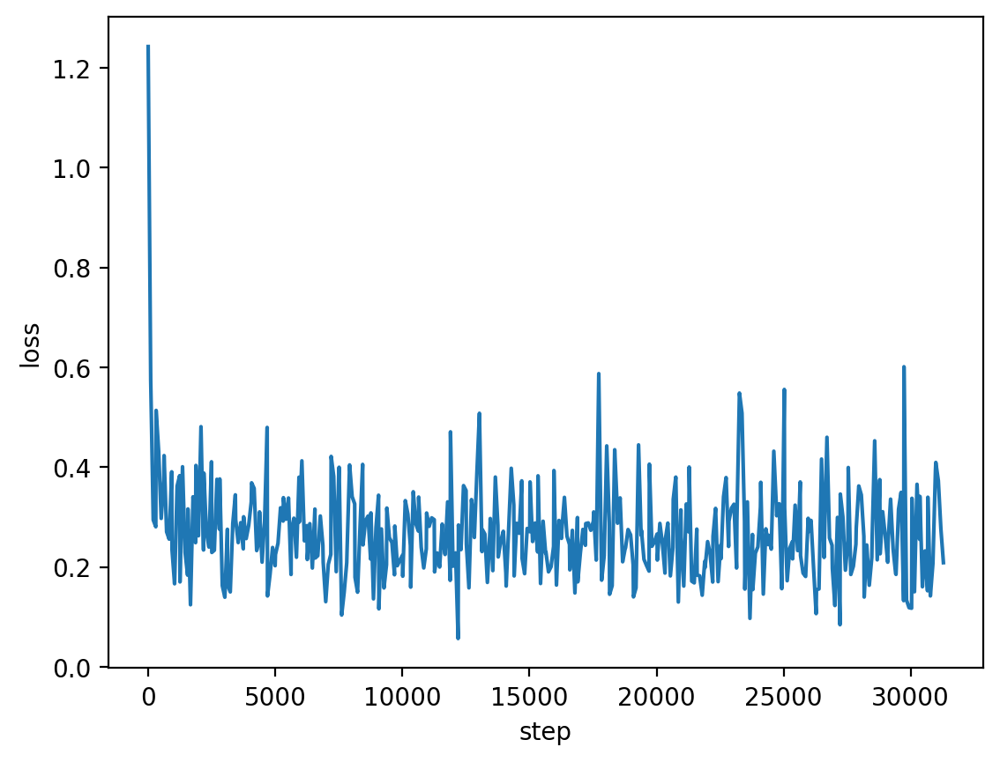

In [ ]:
from IPython.display import clear_output

model = EpsMLP(data_dim=2, hidden=256).to(device)
diff = GaussianDiffusion(model, image_shape=(2,), timesteps=1000, beta_schedule="linear").to(device)
n_epochs = 100
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

# for plotting
log_step = 100
losses = []
steps = []

for epoch in range(n_epochs):

    for i, (X_batch, y_batch) in enumerate(loader):
        optimizer.zero_grad()
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)

        loss = diff.compute_loss(X_batch)
        loss.backward()
        optimizer.step()

        if i % log_step == 0:
            # visualize loss curve
            clear_output(wait=True)
            steps.append(i + epoch * len(loader))
            losses.append(loss.item())
            plt.plot(steps, losses)
            plt.ylabel("loss")
            plt.xlabel("step")
            plt.show()

**Note**: for diffusion, it is common that loss does not decrease after some point, **but** the quality still increases! So it is especially important to log some metrics and sample diffusion outputs from time-to-time to monitor if the generation gets better.

With the trained diffusion we can sample elements from random noise. Let's sample 1000 examples and see if it resembles the original toy dataset.

In [ ]:
with torch.no_grad():
    samples, _ = diff.sample(n=1000)  # shape [1000,2]
    # denormalize using dataset mean and std
    samples = samples.cpu() * dataset.std + dataset.mean

Text(0, 0.5, 'Feature 2')

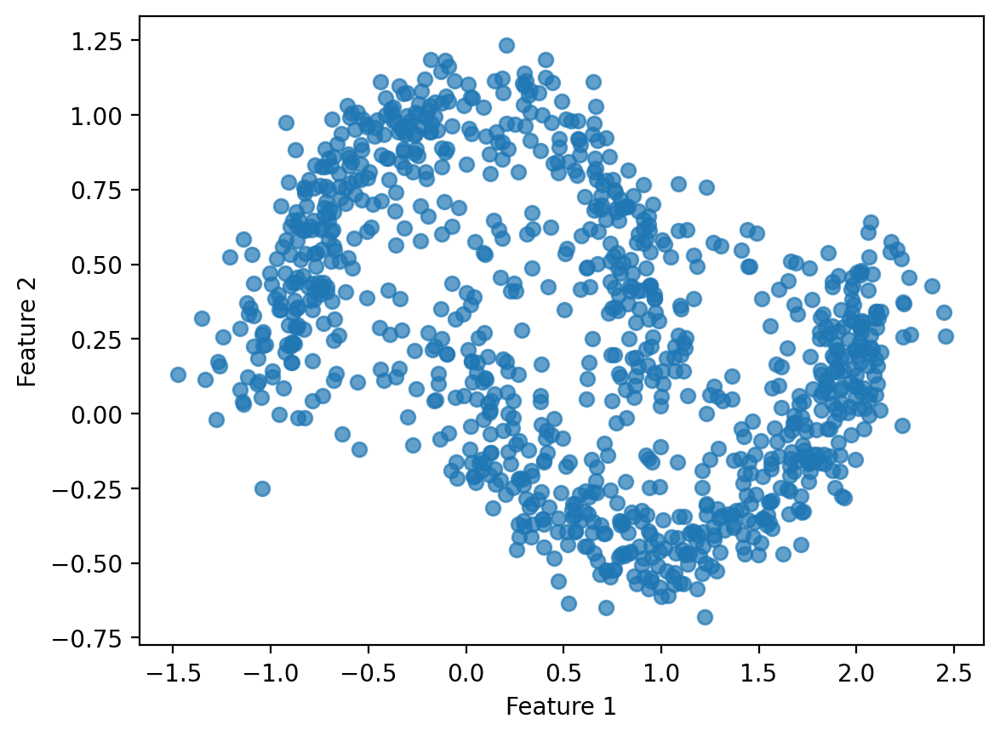

In [ ]:
plt.scatter(samples[:, 0], samples[:, 1], alpha=0.7)

plt.xlabel("Feature 1")
plt.ylabel("Feature 2")

Looks similar, but we did not use classes for now. Let's add them. We only need to modify the model and the part of the diffusion class where we call model inference:

In [ ]:
class GaussianDiffusionWithClasses(GaussianDiffusion):
    def p_mean_variance(self, xt, t, y):
        """
        Compute mean from Eq 11 and variance.
        We use \tilde{\beta} version of variance, a.k.a. fixed-small
        (i.e. the same variance as in q)

        Args:
          xt (Tensor): sample after t additions of noise.
          t (LongTensor): timestep (B, )
          y (LongTensor): class id (B, )
        Returns:
          model_mean (Tensor): computed mean.
          posterior_var (Tensor): computer var.
          posterior_log_var (Tensor): computed log_var
        """
        eps_pred = self.model(xt, t, y)
        coef = self.extract(self.sqrt_recip_alphas, t, xt.shape)
        betas_t = self.extract(self.betas, t, xt.shape)
        model_mean = coef * (xt -\
            betas_t / self.extract(self.sqrt_one_minus_alphas_cumprod, t, xt.shape) * eps_pred
        )
        posterior_var = self.extract(self.posterior_variance, t, xt.shape)
        posterior_log_var = self.extract(self.posterior_log_variance_clipped, t, xt.shape)
        return model_mean, posterior_var, posterior_log_var

    @torch.no_grad()
    def p_sample(self, xt, t, y):
        """
        Sample x_{t-1} from xt and t.

        Combines Eq.1 and p_mean_variance

        Args:
          xt (Tensor): current noisy sample.
          t (LongTensor): (B, ) which timestep to use to get x_{t-1}
          y (LongTensor): class id (B, ).
        Returns:
          x_{t-1} (Tensor): previous sample.
        """
        model_mean, _, model_log_var = self.p_mean_variance(xt, t, y)
        if (t == 0).all():
            return model_mean
        noise = torch.randn_like(xt)
        return model_mean + torch.exp(0.5 * model_log_var) * noise

    @torch.no_grad()
    def sample(self, n, y, log_step=100):
        """
        Sample n images from random noise.

        Args:
          n (int): number of images.
          y (LongTensor): class id (B, ).
          log_step (int): return k*log_step-th representation.
        Returns:
          x0 (Tensor): x0 from random noise.
          x_inter (list[Tensor]): intermediate representations.
        """
        shape = (n, *self.image_shape)
        xt = torch.randn(shape, device=self.device)
        x_inter = [xt]
        for i in reversed(range(self.T)):
            t = torch.full((n,), i, device=self.device, dtype=torch.long)
            xt = self.p_sample(xt, t, y)
            if i % log_step == 0:
                x_inter.append(xt)
        return xt, x_inter  # typically clamp/convert to [0,1] outside

    def compute_loss(self, x0, y):
        """
        Compute loss (Eq. 14)

        Args:
          x0 (Tensor): start position.
          y (LongTensor): class id (B, )
        """
        B = x0.size(0)
        t = torch.randint(0, self.T, (B,), device=x0.device).long()
        eps = torch.randn_like(x0)
        xt = self.q_sample(x0, t, noise=eps)
        eps_pred = self.model(xt, t, y)
        return F.mse_loss(eps_pred, eps)

Add class embeddings to the MLP you had and concatenate them with input and $t$:

In [ ]:
class EpsMLPWithClasses(nn.Module):
    def __init__(self, data_dim=2, hidden=128, t_dim=64, y_dim=64):
        super().__init__()
        self.t_embedding = nn.Embedding(1000, t_dim)
        self.cls_embedding = nn.Embedding(2, y_dim)
        self.model = nn.Sequential(
            nn.Linear(data_dim + t_dim + y_dim, hidden),
            nn.SiLU(),
            nn.Linear(hidden, hidden),
            nn.SiLU(),
            nn.Linear(hidden, hidden),
            nn.SiLU(),
            nn.Linear(hidden, data_dim)
        )

    def forward(self, x, t, y):
        """
        Args:
          x (Tensor): input data (B, 2)
          t (Tensor): timestep (B,)
          y (Tensor): class id (B,)
        Returns:
          eps (Tensor): predicted noise (B, 2)
        """
        te = self.t_embedding(t)  # [B, t_dim]
        ye = self.cls_embedding(y)
        h = torch.cat([x, te, ye], dim=-1)
        return self.model(h)


Let's run the training again, but now pass $y$ to the loss calculation

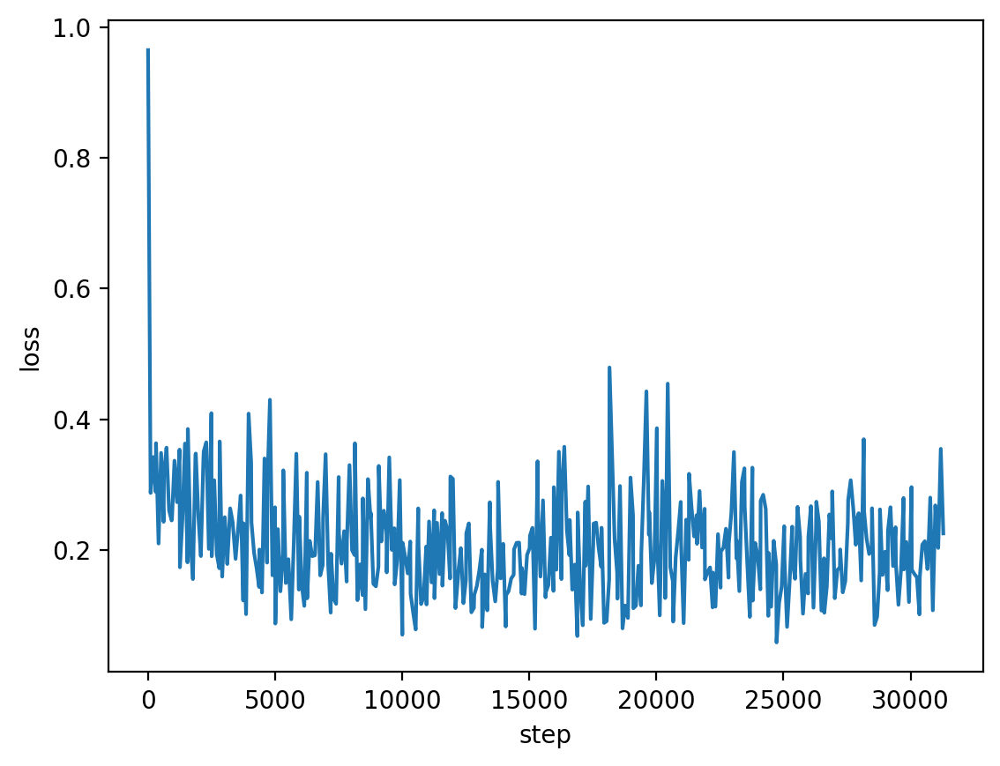

In [ ]:
from IPython.display import clear_output

model = EpsMLPWithClasses(data_dim=2, hidden=256).to(device)
diff = GaussianDiffusionWithClasses(model, image_shape=(2,), timesteps=1000, beta_schedule="linear").to(device)
n_epochs = 100
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

log_step = 100
losses = []
steps = []

for epoch in range(n_epochs):

    for i, (X_batch, y_batch) in enumerate(loader):
        optimizer.zero_grad()
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)

        loss = diff.compute_loss(X_batch, y_batch)
        loss.backward()
        optimizer.step()

        if i % log_step == 0:
            # visualize loss curve
            clear_output(wait=True)
            steps.append(i + epoch * len(loader))
            losses.append(loss.item())
            plt.plot(steps, losses)
            plt.ylabel("loss")
            plt.xlabel("step")
            plt.show()

Let's sample from this Diffusion. We start by randomly assigning classes and then sample from random noise. Let's also keep the intermediate representations for diffusion steps 0, 100, 200, .... Do not forget to include the last 999 diffusion step

In [ ]:
diff_log_step = 100

In [ ]:
y_sample = torch.randint(2, size=(1000, ))

In [ ]:
with torch.no_grad():
    samples, samples_inter = diff.sample(n=1000, y=y_sample.to(device), log_step=diff_log_step)  # shape [1000,2]
    samples = samples.cpu() * dataset.std + dataset.mean
    samples_inter = [elem.cpu() * dataset.std + dataset.mean for elem in samples_inter]

Let's visualize the samples

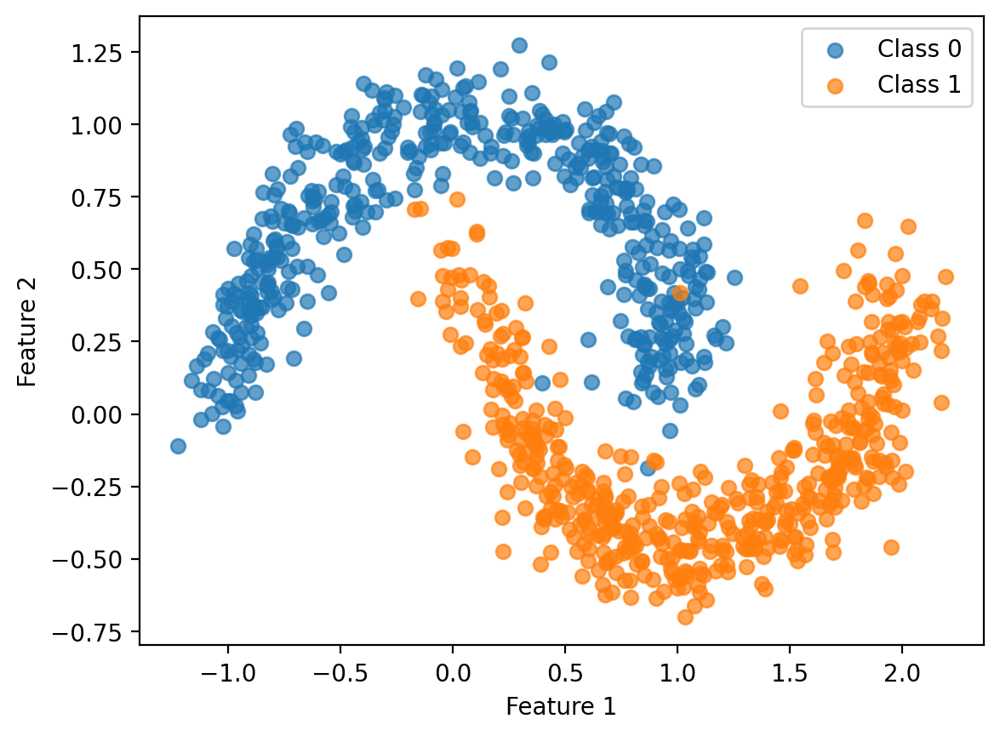

In [ ]:
plt.scatter(samples[y_sample==0, 0], samples[y_sample==0, 1], label="Class 0", alpha=0.7)
plt.scatter(samples[y_sample==1, 0], samples[y_sample==1, 1], label="Class 1", alpha=0.7)

plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.legend()

We see that class conditioning also produced sharper moons. Why?

Answer: without classes, the model had to learn an "average" distribution because mools were "pooling" it in opposite directions making the moons look wider and noiser

Let's see how the forward and backward processes iteratively add and remove noise.

For the forward process, we will provide moons from the dataset as $x_0$. We computer intermediate backward representations previously.

In [ ]:
new_dataset = MoonDataset(n=1000)
X0 = torch.cat([X.unsqueeze(0).to(device) for X, _ in new_dataset], dim=0)
y0 = torch.cat([y.unsqueeze(0) for _, y in new_dataset], dim=0)
_, forward_inter = diff.q_sample_loop(X0, log_step=diff_log_step)
forward_inter = [elem.cpu() * new_dataset.std + new_dataset.mean for elem in forward_inter]

In [ ]:
timesteps = [diff_log_step * k for k in range(diff.T // diff_log_step)] + [diff.T-1]

In [ ]:
timesteps

[0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 999]

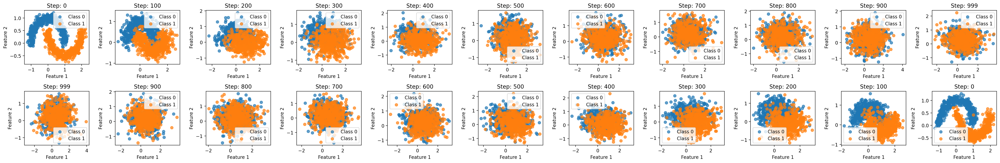

In [ ]:
fig, axes = plt.subplots(2, len(timesteps), figsize=(30, 5))
for j in range(len(timesteps)):
    axes[0][j].set_title(f"Step: {list(timesteps)[j]}")
    X_data = forward_inter[j]
    axes[0][j].scatter(X_data[y0==0, 0], X_data[y0==0, 1], label="Class 0", alpha=0.7)
    axes[0][j].scatter(X_data[y0==1, 0], X_data[y0==1, 1], label="Class 1", alpha=0.7)
    axes[0][j].set_xlabel("Feature 1")
    axes[0][j].set_ylabel("Feature 2")
    axes[0][j].legend()


    axes[1][j].set_title(f"Step: {list(reversed(timesteps))[j]}")
    X_data = samples_inter[j]
    axes[1][j].scatter(X_data[y_sample==0, 0], X_data[y_sample==0, 1], label="Class 0", alpha=0.7)
    axes[1][j].scatter(X_data[y_sample==1, 0], X_data[y_sample==1, 1], label="Class 1", alpha=0.7)
    axes[1][j].set_xlabel("Feature 1")
    axes[1][j].set_ylabel("Feature 2")
    axes[1][j].legend()

fig.tight_layout()


Let's get more precise visualizations for steps 0-200

In [ ]:
diff_log_step = 20

In [ ]:
new_dataset = MoonDataset(n=1000)
X0 = torch.cat([X.unsqueeze(0).to(device) for X, _ in new_dataset], dim=0)
y0 = torch.cat([y.unsqueeze(0) for _, y in new_dataset], dim=0)
_, forward_inter = diff.q_sample_loop(X0, log_step=diff_log_step)
forward_inter = [elem.cpu() * new_dataset.std + new_dataset.mean for elem in forward_inter]

In [ ]:
timesteps = [diff_log_step * k for k in range(diff.T // diff_log_step)] + [diff.T-1]

In [ ]:
with torch.no_grad():
    samples, samples_inter = diff.sample(n=1000, y=y_sample.to(device), log_step=diff_log_step)  # shape [1000,2]
    samples = samples.cpu() * dataset.std + dataset.mean
    samples_inter = [elem.cpu() * dataset.std + dataset.mean for elem in samples_inter]

In [ ]:
crop_index = 11
timesteps = timesteps[:crop_index] # crop the timesteps
samples_inter = samples_inter[-crop_index:]

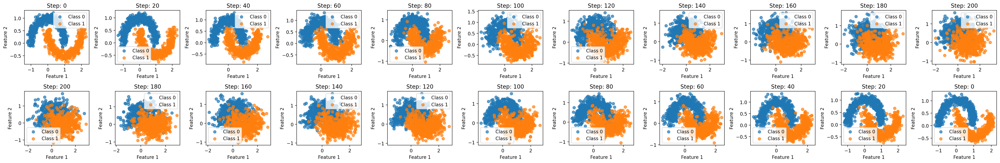

In [ ]:
fig, axes = plt.subplots(2, len(timesteps), figsize=(30, 5))
for j in range(len(timesteps)):
    axes[0][j].set_title(f"Step: {list(timesteps)[j]}")
    X_data = forward_inter[j]
    axes[0][j].scatter(X_data[y0==0, 0], X_data[y0==0, 1], label="Class 0", alpha=0.7)
    axes[0][j].scatter(X_data[y0==1, 0], X_data[y0==1, 1], label="Class 1", alpha=0.7)
    axes[0][j].set_xlabel("Feature 1")
    axes[0][j].set_ylabel("Feature 2")
    axes[0][j].legend()


    axes[1][j].set_title(f"Step: {list(reversed(timesteps))[j]}")
    X_data = samples_inter[j]
    axes[1][j].scatter(X_data[y_sample==0, 0], X_data[y_sample==0, 1], label="Class 0", alpha=0.7)
    axes[1][j].scatter(X_data[y_sample==1, 0], X_data[y_sample==1, 1], label="Class 1", alpha=0.7)
    axes[1][j].set_xlabel("Feature 1")
    axes[1][j].set_ylabel("Feature 2")
    axes[1][j].legend()

fig.tight_layout()


<a name="task_name_2"></a>
## Task 2: Introduction to the `diffusers` Library

In this task, we will go through some basics of `diffusers` library. More specifically, we will work with the [Stable Diffusion](https://arxiv.org/abs/2112.10752) model.

Stable Diffusion is an advanced version of DDPM that operates in the latent space rather than in the image-pixel space. This is achieved by using [Variational AutoEncoder (VAE)](https://arxiv.org/abs/1312.6114) that compresses image into a latent representation, which will then undergo diffusion forward process. The denoised latent is passed to VAE decoder to gen the final image. As before, UNet is used for denoising, however, cross-attention with a text (prompt) encoder is added for conditioning. Working in the latent space significantly cuts computational costs of running the model (by working with $64\times64$ dimension instead of $512\times512$, e.g.) enabling generation of high-resolution images.

`diffusers`, like `transformers` for sequential tasks, is a special lib written by HuggingFace that provides a framework for running and training diffusion models. For example, running Stable Diffusion is not harder than just importing a couple of lines:

In [ ]:
import torch
from diffusers import StableDiffusionPipeline

# we load the model in fp16 to reduce computational burden
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", dtype=torch.float16)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Keyword arguments {'dtype': torch.float16} are not expected by StableDiffusionPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
pipe = pipe.to(device)

  0%|          | 0/50 [00:00<?, ?it/s]

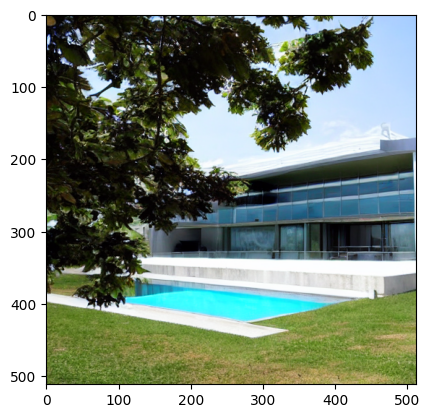

In [ ]:
prompt = "House of an EPFL alumni (big, rich, expensive, with a swimming pool)"
image = pipe(prompt).images[0] # in PIL format

plt.imshow(image)

Due to randomness, the result will be different each time

  0%|          | 0/50 [00:00<?, ?it/s]

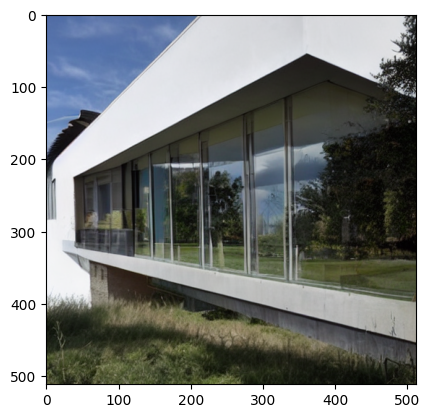

In [ ]:
image = pipe(prompt).images[0] # in PIL format

plt.imshow(image)

<a name="subtask_name_2_A"></a>
## Task 2.A: Running Stable Diffusion

What is happening inside the pipeline? Let's load its components ourselves and try to recreate the pipeline we saw.

As described before, Stable Diffusion uses VAE for encoding image into latent representation. During inference, we start with random noise (which lives in the latent domain) and denoise it using UNet. Unet is conditioned on text embeddings obtained using pre-trained frozen text-encoder. See the diagram below:

<p align="left">
<img src="https://raw.githubusercontent.com/patrickvonplaten/scientific_images/master/stable_diffusion.png" alt="sd-pipeline" width="500"/>
</p>

In the Task 1, we denoised input for all 1000 steps. However, it is not mandatory. There exist scheduler solvers that enable the user to skip some steps during inference (though this speed may come in trade-off to quality). The general idea is the following:

From Eq. 4 ($q(x_t|x_0)$) of the DDPM paper we know:

$$
x_{\tau} = \sqrt{\overline{\alpha_{\tau}}}x_0 + \sqrt{1-\overline{\alpha_{\tau}}}\epsilon \quad \forall \tau \tag{*}
$$

This allows us to approximate $x_0$ given $x_t$ (Eq. 11):

$$
\hat{x_0} = \frac{1}{\sqrt{̅\overline{\alpha_t}}}\left(x_t - \sqrt{1-\overline{\alpha_t}}\epsilon\right)
$$

Since $(*)$ is true for all $\tau$. We can compute $\hat{x_0}$ for $t$ and plug it in $(*)$ for $\tau < t$ instead of real $x_0$:

$$
x_{\tau} = \sqrt{\overline{\alpha_{\tau}}}\hat{x_0} + \sqrt{1-\overline{\alpha_{\tau}}}\epsilon
$$

Because the noiser is the image, the worse is the $\hat{x_0}$ approximation of $x_0$, we do not jump directly from $T=1000$ step to $\tau = 0$. However, we can skip some steps, e.g., skip every 50 steps and do only $\frac{1000}{50}$ steps in total.

**Note**: during training, we randomly choose $t$ each time, meaning that we cover all possible $\tau$ from $0$ to $1000$ and therefore can do this for any of the valid $\tau$.

For more details, you can read [Denoising Diffusion Implicit Models (DDIM)](https://arxiv.org/abs/2010.02502). Different solver variations exist. See https://huggingface.co/docs/diffusers/api/schedulers/overview

So, to run Stable Diffusion, we need VAE, UNet, TextEncoder and Scheduler. We can get all of this from corresponding subfolders of the stable diffusion repo:

In [ ]:
from transformers import CLIPTextModel, CLIPTokenizer
from diffusers import AutoencoderKL, UNet2DConditionModel, PNDMScheduler

# 1. Load the autoencoder model which will be used to decode the latents into image space.
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")

# 2. Load the tokenizer and text encoder to tokenize and encode the text.
# tokenizer: text -> ids
# text_encoder: ids -> embeddings
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# 3. The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

In [ ]:
vae = vae.to(device)
text_encoder = text_encoder.to(device)
unet = unet.to(device)

During training, we train with steps from $0$ to $1000$ anyway. Scheduler solvers are only about inference. So we can actually choose any. Let's use LMSDiscreteScheduler for example

In [ ]:
from diffusers import DDIMScheduler


scheduler = DDIMScheduler.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="scheduler")

We can choose how many steps we want to do during inference (speed -- quality trade-off)

In [ ]:
num_inference_steps = 100
scheduler.set_timesteps(num_inference_steps)

Now we have all the modules. Let's combine them:

In [ ]:
prompt = "House of an EPFL alumni (big, rich, expensive, with a swimming pool)"


def get_text_embeddings(prompt):
    # Apply tokenizer and text encoder on prompt
    # pad prompt to tokenizer.model_max_length
    text_ids = tokenizer(prompt, padding="max_length",
                        max_length=tokenizer.model_max_length,
                        truncation=True, return_tensors="pt").input_ids
    # pass input_ids to text encoder
    with torch.no_grad():
        text_embeddings = text_encoder(text_ids.to(device))[0]
    return text_embeddings

text_embeddings = get_text_embeddings(prompt)

In [ ]:
text_embeddings.shape

torch.Size([1, 77, 768])

In [ ]:
# initialize random noise in the latent domain
# recall that latent domain reduces width\height by a factor of 8

batch_size = 1
in_channels = unet.config.in_channels
height = 512
width = 512

def get_latents():
    latents = torch.randn(
      (batch_size, in_channels, height // 8, width // 8)
    )
    latents = latents.to(device)
    return latents

latents = get_latents()

Denoise latents using each $t$ from `scheduler.timesteps`:

In [ ]:
from tqdm.auto import tqdm

for t in tqdm(scheduler.timesteps):
  # predict the noise residual
  with torch.no_grad():
    # pass text_embeddings as encoder_hidden_states
    # predictions from the model is called .sample
    noise_pred = unet(latents, t, encoder_hidden_states=text_embeddings).sample

  # compute the previous noisy sample x_t -> x_t-1
  # in HF it is called prev_sample
  # use scheduler.step
  latents = scheduler.step(noise_pred, t, latents).prev_sample

  0%|          | 0/100 [00:00<?, ?it/s]

We successfully denoised noise in the latent domain. No we need to go back to the pixel domain. Use `vae.decode` for that:

In [ ]:
# latents are assumed to be scaled during training
# we need to undo scaling by dividing with vae.config.scaling_factor

latents = latents / vae.config.scaling_factor
with torch.no_grad():
  image = vae.decode(latents).sample

Note that for stability purposes images are in $[-1,1]$ and need to be converted back:

In [ ]:
image.min(), image.max()

(tensor(-1.0710, device='cuda:0'), tensor(1.2013, device='cuda:0'))

In [ ]:
image = (image / 2 + 0.5).clamp(0, 1)
image.shape

torch.Size([1, 3, 512, 512])

To visiualize image, we need to permute dimensions to $H\times W \times C$:

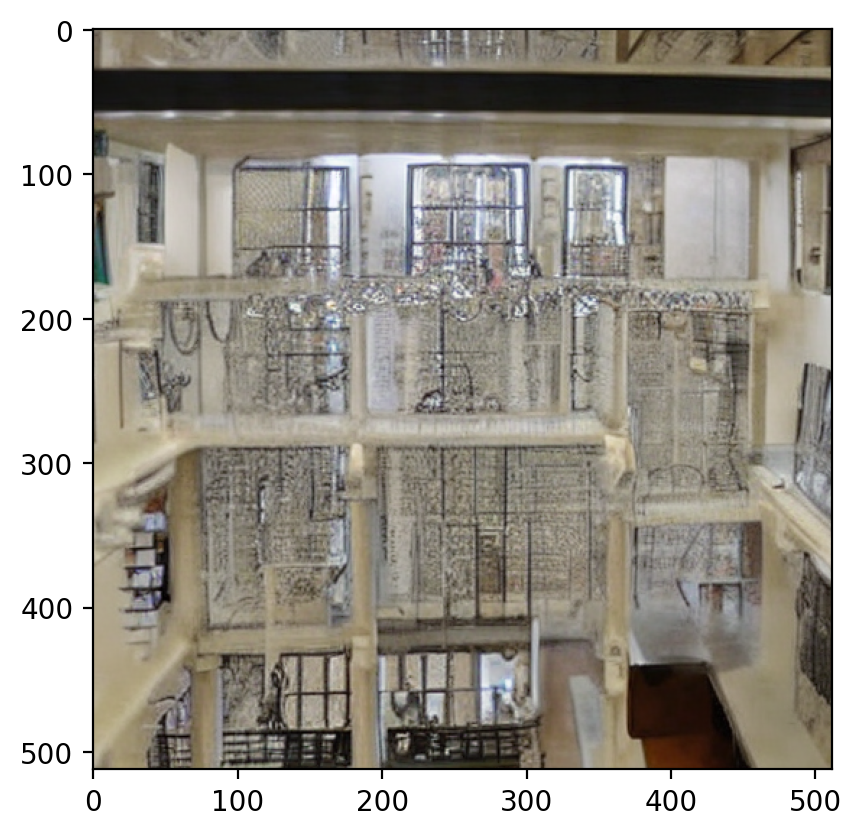

In [ ]:
plt.imshow(image[0].permute(1, 2, 0).detach().cpu())

<a name="subtask_name_2_B"></a>
## Task 2.B: Classifier-Free Guidance Experiments

In generative models, there is a well-known concept of "vector arithmetics". The first paper that discovered such arithmetics in the noise domain of generative models, was in GANs literature: [Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks (Section 6.3.2)](https://arxiv.org/abs/1511.06434). If one noise correspond to Object1 and another to Object2, then the average of these noises correspond to something which looks like an average mixture of Object1 and Object2. This allows to add specific features to an object by moving its noise vector towards some "style" direction.

When we predict $\epsilon$ using Unet conditioned on text, we get $\epsilon_{\text{text}}$ that **implicitly (the model does not explicitly separate the information into this)** contains information about:

1. How, in general, a plausible image should look like? General information that is not related to the actual prompt

2. How should the image look like to be aligned with the prompt? Some prompt-specific features (like having a house on the image, e.g.)


Let's now compute an unconditional (text is set to an empty string) $\epsilon_{\text{uncond}}$. Because there is no condition, this $\epsilon_{\text{uncond}}$ should represent generic information that is not specific to any prompt. Hence if we subtract $\epsilon_{\text{uncond}}$ from $\epsilon_{\text{text}}$, we should get the "style" direction of our diffusion model that make the prediction aligned with the prompt. Thus, to generate an image, we can use the weighted sum of these epsilons:
$$
\epsilon_{\text{total}} = \epsilon_{\text{uncond}} + s \cdot (\epsilon_{\text{text}} - \epsilon_{\text{uncond}}),
$$
where $s$ is the "guidance factor". If $s=0$, there is no conditioning, if $s=1$, we get our standard $\epsilon_{\text{text}}$ and if $s > 1$ the generation is even more aligned with the prompt. This technique is known as classifier-free guidance. See [Classifier-Free Diffusion Guidance](https://arxiv.org/abs/2207.12598) for more details.

Let's rewrite the code from Task 2.A using this equation and explore how different $s$ impacts the generation

In [ ]:
# create random latents again

latents = get_latents()

In [ ]:
# we need to have unconditional text embedding
text_embeddings_uncond = get_text_embeddings(prompt="")

Instead of running the pipeline twice (with and without condition), we can concatenate the conditioned version with the unconditioned one across the batch dimension and treat it like running the model with batch_size = 2.

In [ ]:
total_text_embeddings= torch.cat([text_embeddings, text_embeddings_uncond])

In [ ]:
def diffusion_pipeline(orig_latents, s=1.0):
  # copy latents so we can reuse them with different s
  latents = orig_latents.clone()
  for t in tqdm(scheduler.timesteps):

      # concat latents with itself across batch dim to avoid running the model twice
      latents_total = torch.cat([latents, latents])
      # predict the noise residual
      with torch.no_grad():
        # pass text_embeddings as encoder_hidden_states
        # predictions from the model is called .sample
        noise_pred = unet(latents_total, t, encoder_hidden_states=total_text_embeddings).sample

      # get noise_text (eps_text) and noise_uncond from noise_pred (split batch)
      noise_text, noise_uncond = noise_pred.chunk(2)
      # use guidance equation to compute noise_total
      noise_total = noise_uncond + s * (noise_text - noise_uncond)

      # use noise_total to update latents
      # compute the previous noisy sample x_t -> x_t-1
      # in HF it is called prev_sample
      # use scheduler.step
      latents = scheduler.step(noise_total, t, latents).prev_sample

  # decode using VAE, move to [0, 1] and convert to image format

  latents = latents / vae.config.scaling_factor
  with torch.no_grad():
    image = vae.decode(latents).sample

  image = (image / 2 + 0.5).clamp(0, 1)
  return image[0].permute(1, 2, 0).detach().cpu()

Try different $s$ (small ones from $0$ to $1$ (with something in between), middle (7-8) and very big ones $100$-$1000$, e.g.). Create two arrays: `s_options` with different values of $s$ and corresponding array of images (`images[i]` corresponds to `s_options[i]`). Use the same latents

In [ ]:
s_options = [0, 0.1, 0.5, 1, 7, 100, 300, 1000]
images = []
for s in s_options:
  images.append(diffusion_pipeline(latents, s))

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

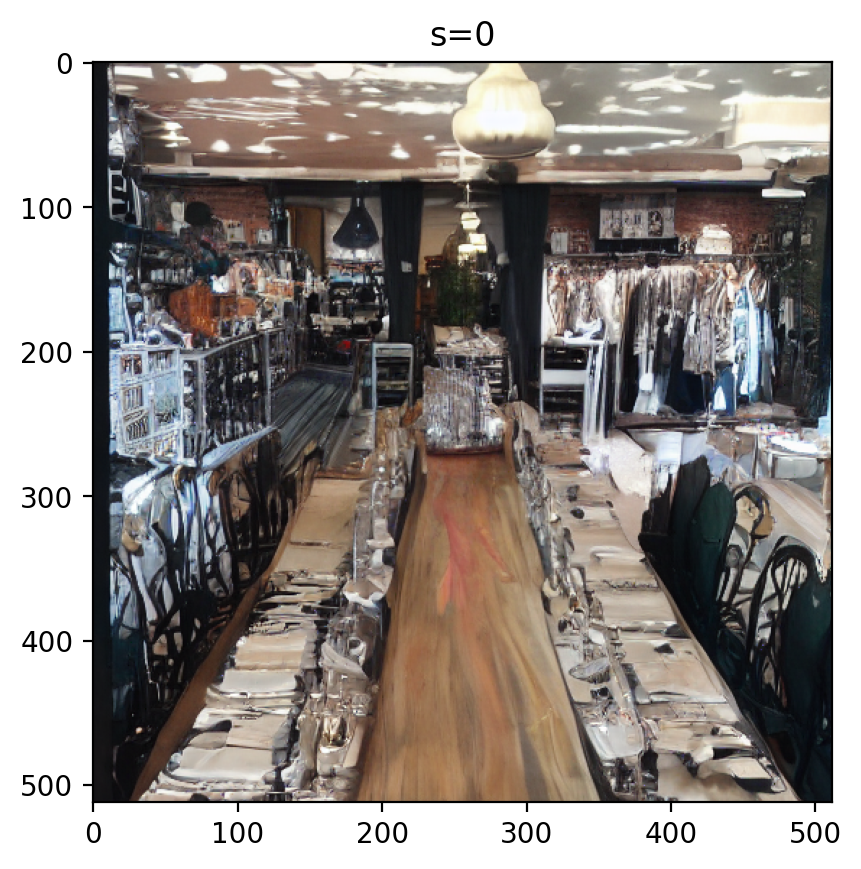

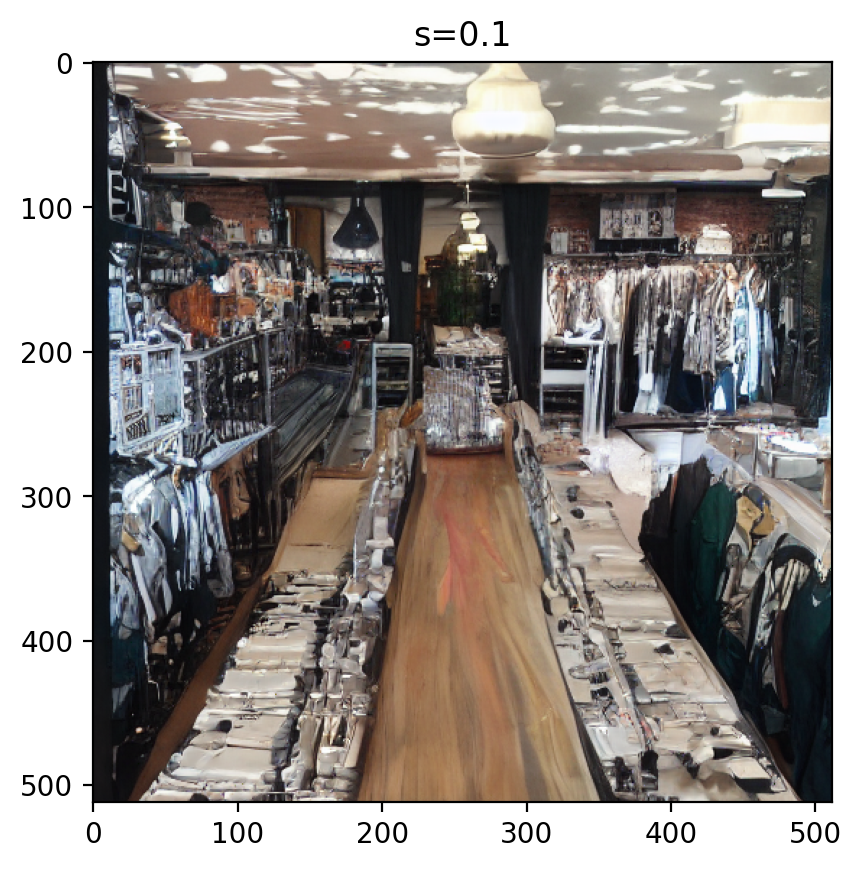

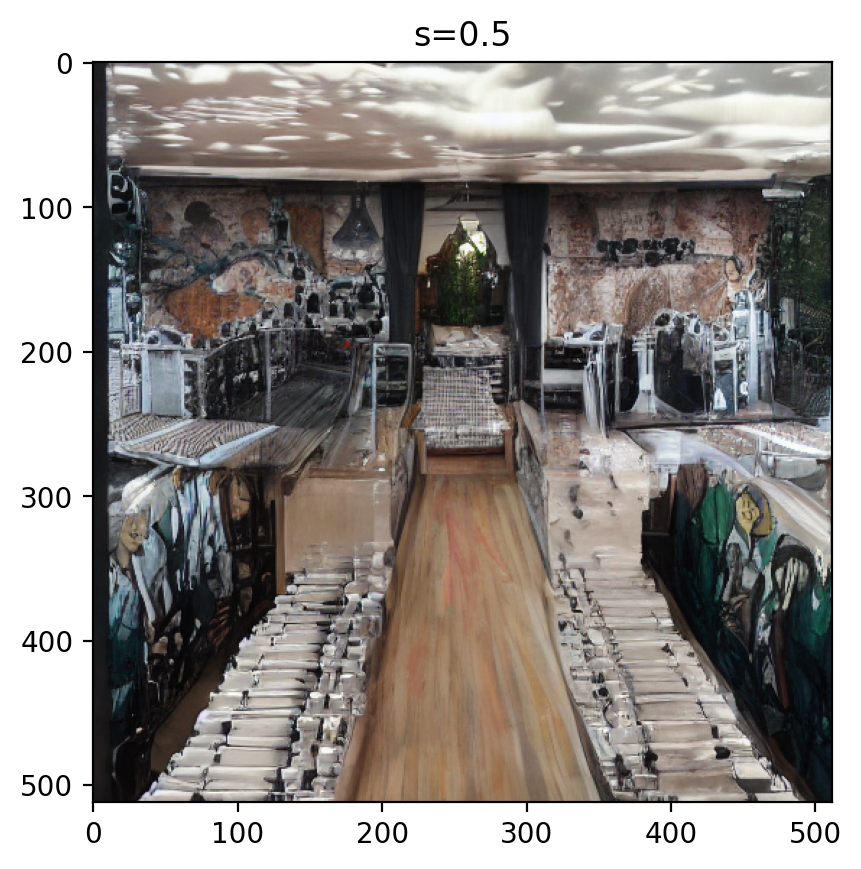

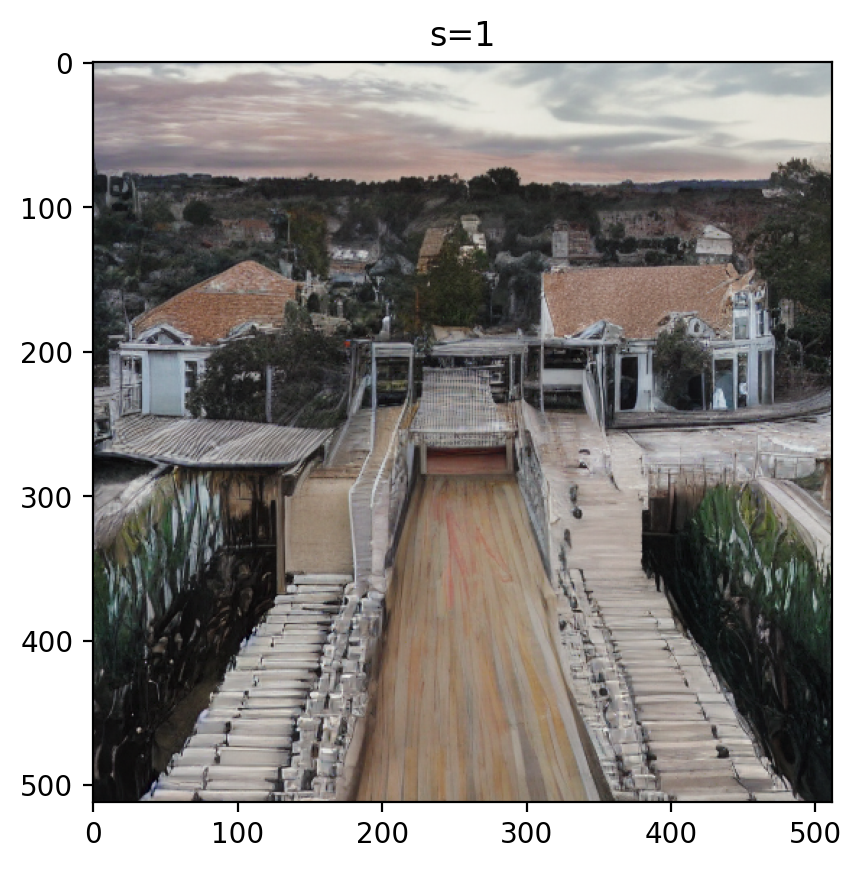

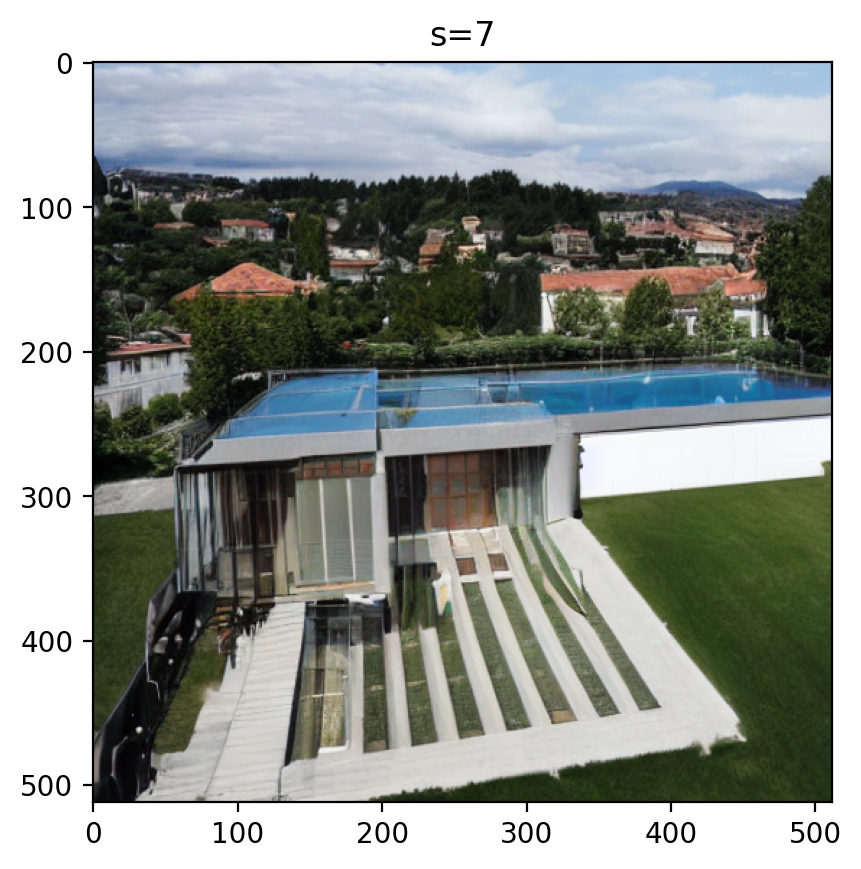

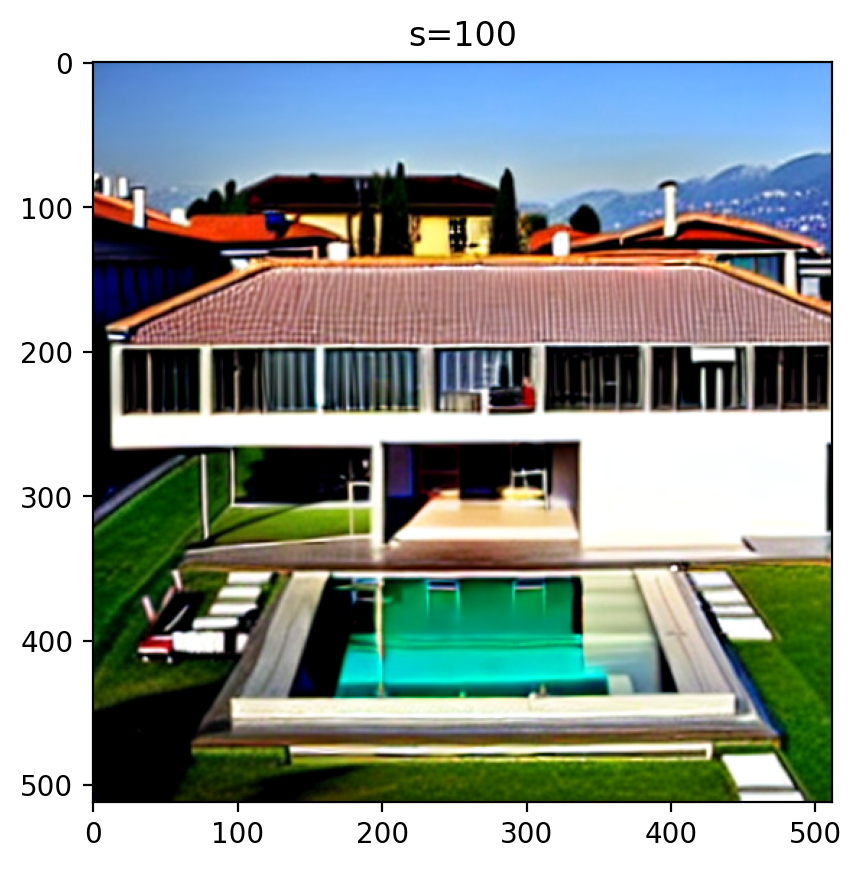

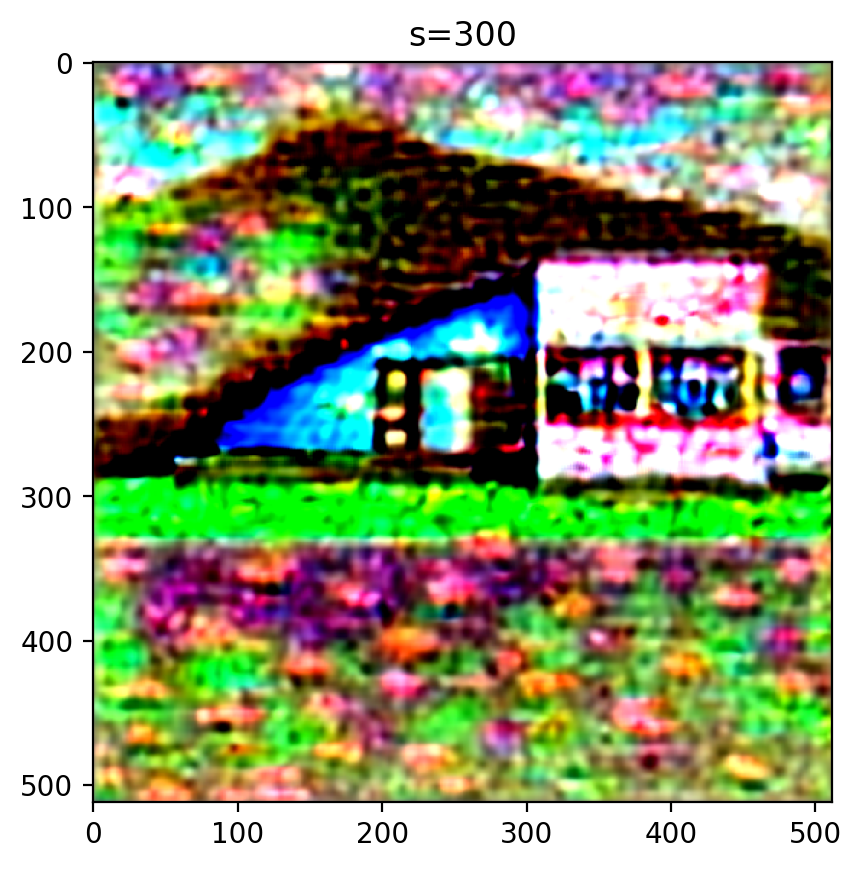

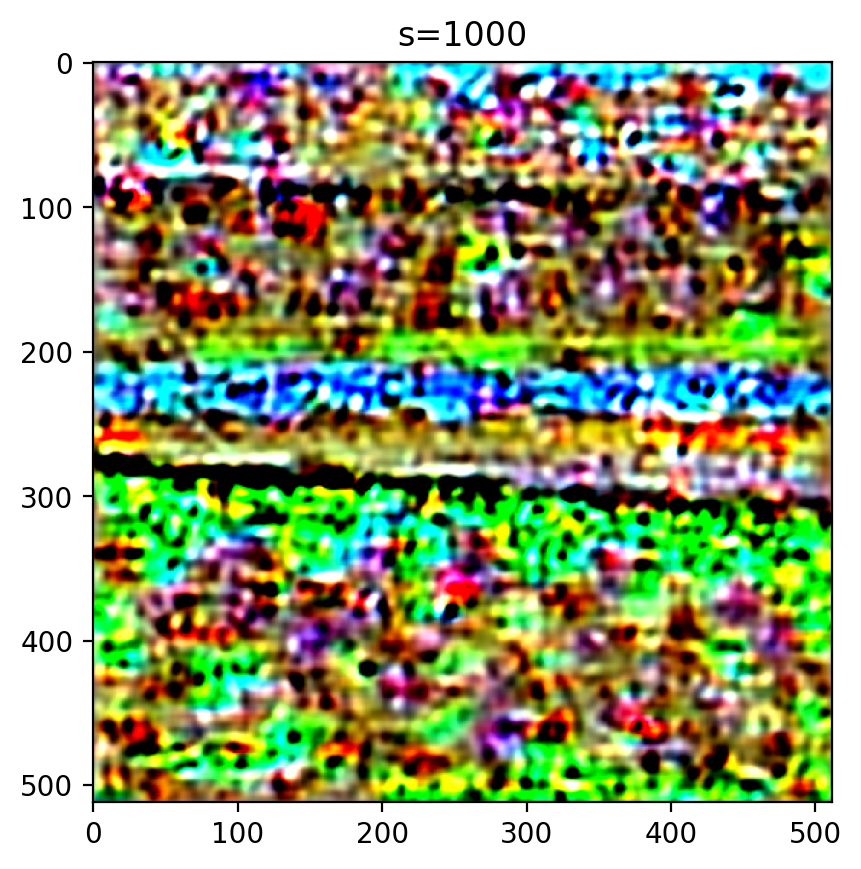

In [ ]:
# visualize images
for s, image in zip(s_options, images):
    plt.imshow(image)
    plt.title(f"s={s}")
    plt.show()

Reflect on the generated images for each $s$. How different values of $s$ impact the generation?

Answer:

1. We see that with $s=0$ the image looks nothing like the prompt. It is expected, since $s=0$ corresponds to unconditional generation and we just get some generic image (mixture of the images the diffusion saw during training)

2. When we add some $s$ (increase from $0$ to $1$), prompt-specific features begin to appear. The bigger the $s$, the more prompt-related content we see. The similarity of these images shows that indeed bigger $s$ just "moves" us toward the style direction.

3. While $s=1$ reflects some part of the prompt, some prompt-specific details are missing (e.g. pool). They start to appear with middle-valued $s$, such as $7$.

4. When $s$ goes too high, we see prompt-specific details, however the image becomes less natural. Some artifacts, like saturation of colors appear. Artifacts become more severe as $s$ increases. After some point the diffusion completely forgets how the image should look like and returns some colored noise (like we see with $s=1000$)